# 1. Instalação das Bibliotecas

In [1]:
# %pip install -U pandas
# %pip install -U numpy
# %pip install -U matplotlib
# %pip install -U seaborn
# %pip install -U openpyxl
# %pip install -U scikit-learn
# %pip install -U plotly
# %pip install -U statsmodels
# %pip install -U nbformat
# %pip install graphviz
# %pip install pydotplus
# %pip install shap
# %pip install joblib

# 2. Importando as Bibliotecas

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import openpyxl
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from datetime import datetime
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.tree import plot_tree
from sklearn.tree import export_text
from sklearn.tree import _tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz
from sklearn.model_selection import cross_val_score
from IPython.display import Image
import pydotplus
import nbformat
import graphviz
import shap
import lime
import lime.lime_tabular
from joblib import Parallel, parallel_backend
import time
import threading
import multiprocessing



c:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 3. Parametros universais

In [3]:
parametro_random_state = 42

In [4]:
tempo_limite = 120

# 3. Importando os dados

Os datasets a serem carregados neste projeto são referentes à análise histopatológica de punção aspirativa de agulha fina (PAAF) de massas tumorais coletadas de tecido mamário e tecido prostático.<br>
Após coleta e tratamento do material biológico, os mesmos foram preparados para análise histopatológica e avaliados em microscópio confocal com software acoplado para auxílio na análise das imagens.

## 3.1. Câncer de mama

In [5]:
# Primeiro dataset (link)
bc_url = r"https://raw.githubusercontent.com/MYoussef885/Breast_Cancer_Classification_using_NN/refs/heads/main/data_bc.csv"
breast_cancer_df1 = pd.read_csv(bc_url)

In [6]:
# Segundo dataset (CSV)
breast_cancer_df2 = pd.read_csv(r"C:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\tcc_breast_cancer\venv_tcc\datasets\cancer_data.csv")

## 3.2. Câncer de Próstata

In [7]:
# Primeiro dataset (url)
pc_url = r"https://raw.githubusercontent.com/duttashi/learnr/refs/heads/master/data/misc/Prostate_Cancer.csv"
prostate_cancer_df1 = pd.read_csv(pc_url)

In [8]:
# Segundo dataset (CSV)
prostate_cancer_df2 = pd.read_csv(r"C:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\tcc_breast_cancer\venv_tcc\datasets\prostate_data_dataset.csv")

# 4. Análise exploratória dos dados

## 4.1. Primeiro Dataframe (breast_cancer_df1)

In [9]:
# 1. Fazendo uma cópia do df original
bc_df1 = breast_cancer_df1.copy()

In [10]:
# 2. Adicionando uma coluna com o tecido de origem da amostra
bc_df1['tissue'] = "Mammary tissue"

In [11]:
# 3. compeendendo o formato do dataframe
bc_df1.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,tissue
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,Mammary tissue
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,Mammary tissue
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,Mammary tissue
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,Mammary tissue
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,Mammary tissue


In [12]:
bc_df1.shape# ververificandvvvvvvaa

(569, 33)

In [13]:
bc_df1.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'tissue'],
      dtype='object')

In [14]:
bc_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

Como é possivel verificar, não há valores nulo no dataframe acima.<br>
Desta forma, a limpeza de dados nulos não se faz necessária.

In [15]:
# Verificando a presença de dados duplicados
bc_df1[bc_df1.duplicated(['id'], keep = False)]


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,tissue


Como é possível verificar, não há IDs duplicados

## 4.2. Segundo Dataframe (breast_cancer-df2)

In [16]:
# 1. Fazendo uma cópia do df original
bc_df2 = breast_cancer_df2.copy()

In [17]:
# 2. Adicionando uma coluna com o tecido de origem da amostra
bc_df2['tissue'] = "Mammary tissue"

In [18]:
# 3. compeendendo o formato do dataframe
bc_df2.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,id,name,age,gender,diagnosis,tissue
0,17.663889,24.373028,101.416419,900.736303,0.118745,0.118216,0.230131,0.049139,0.178416,0.061777,...,0.243875,0.141979,0.437508,0.085149,6e686fc9-6bf0-47f7-b0a4-f594ac1ba631,Rebecca Henry,54,Female,M,Mammary tissue
1,18.495713,16.849785,95.214344,1802.804701,0.076270,0.115014,0.069425,0.085209,0.190750,0.059145,...,0.582906,0.204758,0.430243,0.112520,0762f3ba-1a35-46f6-8178-7262e4b03c35,Amber Chase,48,Female,M,Mammary tissue
2,13.670708,20.744454,122.494028,1102.924350,0.131681,0.080523,0.218740,0.069166,0.186455,0.054309,...,0.654366,0.249836,0.331515,0.109775,3cb8492d-529a-45b0-8280-d601f60619d9,Mrs. Felicia Ramos,44,Female,M,Mammary tissue
3,14.883033,25.348880,78.639046,599.313206,0.118639,0.127509,0.089714,0.000000,0.142790,0.070940,...,0.185848,0.090172,0.208906,0.068242,3344e34c-e57d-45ef-bc22-74b3f348bf5a,Angelica Edwards,34,Female,B,Mammary tissue
4,13.856493,17.106242,69.960736,500.512169,0.088018,0.068543,0.031146,0.019156,0.193891,0.062520,...,0.076878,0.113494,0.264636,0.067202,35699820-e233-42f0-9f1c-57be9685b35f,Angela Anderson,57,Female,B,Mammary tissue


In [19]:
 # Verificando o formato do dataframe 
bc_df2.shape

(4983, 36)

In [20]:
bc_df2.columns

Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'id', 'name', 'age',
       'gender', 'diagnosis', 'tissue'],
      dtype='object')

In [21]:
bc_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4983 entries, 0 to 4982
Data columns (total 36 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   radius_mean              4983 non-null   float64
 1   texture_mean             4983 non-null   float64
 2   perimeter_mean           4983 non-null   float64
 3   area_mean                4983 non-null   float64
 4   smoothness_mean          4983 non-null   float64
 5   compactness_mean         4983 non-null   float64
 6   concavity_mean           4983 non-null   float64
 7   concave points_mean      4983 non-null   float64
 8   symmetry_mean            4983 non-null   float64
 9   fractal_dimension_mean   4983 non-null   float64
 10  radius_se                4983 non-null   float64
 11  texture_se               4983 non-null   float64
 12  perimeter_se             4983 non-null   float64
 13  area_se                  4983 non-null   float64
 14  smoothness_se           

Como é possivel verificar, não há valores nulo no dataframe acima.<br>
Desta forma, a limpeza de dados nulos não se faz necessária.

In [22]:
# Verificando a presença de dados duplicados
bc_df2[bc_df2.duplicated(['id'], keep = False)]


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,id,name,age,gender,diagnosis,tissue


Como é possível verificar, não há IDs duplicados

## 4.3. Terceiro Dataframe (prostate_cancer_df1)

In [23]:
# 1. Fazendo uma cópia do df original
pc_df1 = prostate_cancer_df1.copy()

In [24]:
# 2. Adicionando uma coluna com o tecido de origem da amostra
pc_df1['tissue'] = "Prostatic tissue"

In [25]:
# 3. compeendendo o formato do dataframe
pc_df1.head()

,id,diagnosis_result,radius,texture,perimeter,area,smoothness,compactness,symmetry,fractal_dimension,tissue
0,1,M,23,12,151,954,0.143,0.278,0.242,0.079,Prostatic tissue
1,2,B,9,13,133,1326,0.143,0.079,0.181,0.057,Prostatic tissue
2,3,M,21,27,130,1203,0.125,0.160,0.207,0.060,Prostatic tissue
3,4,M,14,16,78,386,0.070,0.284,0.260,0.097,Prostatic tissue
4,5,M,9,19,135,1297,0.141,0.133,0.181,0.059,Prostatic tissue


In [26]:
# Verificando o formato do Dataframe
pc_df1.shape

(100, 11)

In [27]:
pc_df1.columns

Index(['id', 'diagnosis_result', 'radius', 'texture', 'perimeter', 'area',
       'smoothness', 'compactness', 'symmetry', 'fractal_dimension', 'tissue'],
      dtype='object')

In [28]:
pc_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 100 non-null    int64  
 1   diagnosis_result   100 non-null    object 
 2   radius             100 non-null    int64  
 3   texture            100 non-null    int64  
 4   perimeter          100 non-null    int64  
 5   area               100 non-null    int64  
 6   smoothness         100 non-null    float64
 7   compactness        100 non-null    float64
 8   symmetry           100 non-null    float64
 9   fractal_dimension  100 non-null    float64
 10  tissue             100 non-null    object 
dtypes: float64(4), int64(5), object(2)
memory usage: 8.7+ KB


Como é possivel verificar, não há valores nulo no dataframe acima.<br>
Desta forma, a limpeza de dados nulos não se faz necessária.

In [29]:
# Verificando a presença de dados duplicados
pc_df1[pc_df1.duplicated(['id'], keep = False)]


,id,diagnosis_result,radius,texture,perimeter,area,smoothness,compactness,symmetry,fractal_dimension,tissue


Como é possível verificar, não há IDs duplicados

## 4.4. Quarto Dataframe (prostate_cancer_df2)

In [30]:
# 1. Fazendo uma cópia do df original
pc_df2 = prostate_cancer_df2.copy()

In [31]:
# 2. Adicionando uma coluna com o tecido de origem da amostra
pc_df2['tissue'] = "Prostatic tissue"

In [32]:
# 3. compeendendo o formato do dataframe
pc_df2.head()

,radius,texture,perimeter,area,smoothness,compactness,symmetry,fractal_dimension,id,name,age,gender,diagnosis_result,tissue
0,24.236212,19.350775,95.201978,849.530359,0.102558,0.054081,0.158665,0.055362,f032cf3e-c0e0-4a9b-83bf-c349e026de3c,William Lin,40,Male,M,Prostatic tissue
1,23.424906,15.561376,98.303329,652.919911,0.125613,0.087457,0.198230,0.066591,26ef5aca-6658-4106-beb2-1b0c6dae8204,Andrew Bridges,34,Male,B,Prostatic tissue
2,16.660974,13.452430,89.632910,463.928594,0.119722,0.156807,0.141016,0.063725,3a27d107-8583-4124-929b-b88f19bb4e86,Joseph Thomas,48,Male,B,Prostatic tissue
3,18.478596,26.996982,96.993208,664.798153,0.119087,0.170351,0.212509,0.061570,1b5e3837-3bd7-4fda-9d4c-6cc07a9a2916,Mike Mora,65,Male,M,Prostatic tissue
4,23.306278,12.185153,58.763361,398.239804,0.114682,0.102284,0.176120,0.075777,c8650634-a393-495c-af4f-6a553a064885,Colton Barnes,49,Male,B,Prostatic tissue


In [33]:
pc_df2.shape# ververificandvvvvvvaa

(4983, 14)

In [34]:
pc_df2.columns

Index(['radius', 'texture', 'perimeter', 'area', 'smoothness', 'compactness',
       'symmetry', 'fractal_dimension', 'id', 'name', 'age', 'gender',
       'diagnosis_result', 'tissue'],
      dtype='object')

In [35]:
pc_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4983 entries, 0 to 4982
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   radius             4983 non-null   float64
 1   texture            4983 non-null   float64
 2   perimeter          4983 non-null   float64
 3   area               4983 non-null   float64
 4   smoothness         4983 non-null   float64
 5   compactness        4983 non-null   float64
 6   symmetry           4983 non-null   float64
 7   fractal_dimension  4983 non-null   float64
 8   id                 4983 non-null   object 
 9   name               4983 non-null   object 
 10  age                4983 non-null   int64  
 11  gender             4983 non-null   object 
 12  diagnosis_result   4983 non-null   object 
 13  tissue             4983 non-null   object 
dtypes: float64(8), int64(1), object(5)
memory usage: 545.1+ KB


Como é possivel verificar, não há valores nulo no dataframe acima.<br>
Desta forma, a limpeza de dados nulos não se faz necessária.

In [36]:
# Verificando a presença de dados duplicados
pc_df2[pc_df2.duplicated(['id'], keep = False)]


,radius,texture,perimeter,area,smoothness,compactness,symmetry,fractal_dimension,id,name,age,gender,diagnosis_result,tissue


Como é possível verificar, não há IDs duplicados

# 5. Concatenando todos os dataframes

Para unificar todos os dataframes, primeiramente será feita uma padronização nas colunas alem do entendimento de quais variáveis são mais relevantes para as próximas etapas.

## 5.1. Concatenando os dataframes de Câncer de Mama

In [37]:
print(bc_df1.columns)
print(bc_df2.columns)

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'tissue'],
      dtype='object')
Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points

In [38]:
# Primeiro Dataframe
bc_df1 = bc_df1[['tissue', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean'
       ]]

# Segundo Dataframe
bc_df2 = bc_df2[['tissue', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean'
       ]]

In [39]:
breast_cancer = pd.concat([bc_df1,bc_df2], ignore_index=True)

In [40]:
breast_cancer.rename(columns = {
    'diagnosis': 'diagnosis_result', 
    'radius_mean': 'radius', 
    'texture_mean': 'texture', 
    'perimeter_mean': 'perimeter', 
    'area_mean': 'area',
    'smoothness_mean': 'smoothness', 
    'compactness_mean': 'compactness', 
    'symmetry_mean': 'symmetry', 
    'fractal_dimension_mean': 'fractal_dimension'
}, inplace = True)


In [41]:
breast_cancer = breast_cancer[['tissue','diagnosis_result','radius', 'texture', 'perimeter', 'area', 'smoothness', 'compactness', 'symmetry', 'fractal_dimension']]

In [42]:
breast_cancer.shape

(5552, 10)

## 5.2. Concatenando os Dataframes de Câncer de Próstata

In [43]:
print(pc_df1.columns)
print(pc_df2.columns)

Index(['id', 'diagnosis_result', 'radius', 'texture', 'perimeter', 'area',
       'smoothness', 'compactness', 'symmetry', 'fractal_dimension', 'tissue'],
      dtype='object')
Index(['radius', 'texture', 'perimeter', 'area', 'smoothness', 'compactness',
       'symmetry', 'fractal_dimension', 'id', 'name', 'age', 'gender',
       'diagnosis_result', 'tissue'],
      dtype='object')


In [44]:
pc_df1 = pc_df1[['tissue','diagnosis_result','radius', 'texture', 'perimeter', 'area', 'smoothness', 'compactness', 'symmetry', 'fractal_dimension']]

pc_df2 = pc_df2[['tissue','diagnosis_result','radius', 'texture', 'perimeter', 'area', 'smoothness', 'compactness','symmetry', 'fractal_dimension']]

In [45]:
prostate_cancer = pd.concat([pc_df1,pc_df2], ignore_index=True)

## 5.3. Dataframe Final

In [46]:
cancer_dataframe = pd.concat([breast_cancer, prostate_cancer], ignore_index=True)

cancer = cancer_dataframe.copy()


## 5.4. Criando um amostra do dataframe para novos testes no modelo.

In [47]:
amostra_cancer = cancer.sample(frac=0.1, random_state = parametro_random_state)
cancer = cancer.drop(amostra_cancer.index)

# 6. Análise multivariada dos dataframes

In [48]:
cancer = cancer[cancer['area']!=0]
cancer = cancer[cancer['texture']!=0]
cancer = cancer[cancer['compactness']!=0]

In [49]:
descricao= cancer.describe()

In [50]:
descricao

,radius,texture,perimeter,area,smoothness,compactness,symmetry,fractal_dimension
count,9452.000000,9452.000000,9452.000000,9452.000000,9452.000000,9452.000000,9452.000000,9452.000000
mean,15.869182,18.986097,94.548279,692.948912,0.099695,0.116900,0.187579,0.063669
std,4.490197,4.772577,24.624607,344.749133,0.014615,0.057196,0.029610,0.007723
min,1.587564,1.007544,21.122987,0.928345,0.041440,0.000202,0.089211,0.033814
25%,12.419275,15.824268,76.383457,440.353833,0.089953,0.074794,0.167144,0.058515
50%,15.381716,19.029924,91.185635,617.031532,0.099737,0.109227,0.186622,0.063548
75%,18.996457,22.219022,111.411146,904.824922,0.109568,0.152846,0.207370,0.068803
max,35.024820,39.280000,201.546848,2501.000000,0.163400,0.345400,0.304000,0.097000


In [51]:
descricao.to_excel(r'C:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\descricao.xlsx')

In [52]:
cancer_barras = cancer.groupby(['tissue', 'diagnosis_result']).size().reset_index(name= 'contagem')
fig = px.bar(
    cancer_barras, 
    x = 'tissue',
    y = 'contagem',
    color = 'diagnosis_result',
    barmode = 'group',
    title  = 'Frequencia de Indivíduos por tipo de tecido e diagnóstico'
)

fig.show()

## Teste de Qui-quadrado e independencia

In [53]:
import scipy.stats as stats

tabela_contingencia = pd.crosstab(cancer['tissue'], cancer['diagnosis_result'])
chi2, p,dof, expected = stats.chi2_contingency(tabela_contingencia)
print (f'valor p: {p}')
print (f'valor qui-quadrado: {chi2}')
print (f'valor dof: {dof}')
print (f'valor expected: {expected}')



if p < 0.05:
    print('Há uma diferença estatisticamente significativa entre os grupos.')
else:
    print('Não há diferença estatisticamente significativa entre os grupos.')

valor p: 0.013307375252666568
valor qui-quadrado: 6.1277814947154425
valor dof: 1
valor expected: [[2483.40107914 2465.59892086]
 [2259.59892086 2243.40107914]]
Há uma diferença estatisticamente significativa entre os grupos.


In [54]:
# Encontrar o menor número de amostras por grupo
min_count = cancer.groupby(['tissue', 'diagnosis_result']).size().min()

# Aplicar undersampling para que cada grupo contenha o mesmo número de indivíduos
cancer_balanceado = cancer.groupby(['tissue', 'diagnosis_result']).apply(lambda x: x.sample(min_count)).reset_index(drop=True)

print(cancer_balanceado)

                tissue diagnosis_result     radius    texture   perimeter  \
0       Mammary tissue                B  12.526379  20.657526   76.690287   
1       Mammary tissue                B  11.902945  19.011879   80.995434   
2       Mammary tissue                B  15.409111  24.990740   77.086695   
3       Mammary tissue                B  14.279928  16.750558   91.512602   
4       Mammary tissue                B  10.250713  18.975748   70.518598   
...                ...              ...        ...        ...         ...   
8791  Prostatic tissue                M  16.599929  15.997802  134.717397   
8792  Prostatic tissue                M  13.519500  26.478718  100.087551   
8793  Prostatic tissue                M  14.131653  16.968305   74.187745   
8794  Prostatic tissue                M  10.287506  22.946456   97.880693   
8795  Prostatic tissue                M   8.373954  23.732357  136.312957   

             area  smoothness  compactness  symmetry  fractal_dimension  
0

C:\Users\Eduardo Socca\AppData\Local\Temp\ipykernel_3024\370075327.py:5: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [55]:
cancer_barras = cancer_balanceado.groupby(['tissue', 'diagnosis_result']).size().reset_index(name= 'contagem')
fig = px.bar(
    cancer_barras, 
    x = 'tissue',
    y = 'contagem',
    color = 'diagnosis_result',
    barmode = 'group',
    title  = 'Frequencia de Indivíduos por tipo de tecido e diagnóstico'
)

fig.show()

In [ ]:
tabela_contingencia = pd.crosstab(cancer_balanceado['tissue'], cancer_balanceado['diagnosis_result'])
chi2, p,dof, expected = stats.chi2_contingency(tabela_contingencia)
print (f'valor p: {p}')
print (f'valor qui-quadrado: {chi2}')
print (f'valor dof: {dof}')
print (f'valor expected: {expected}')



if p < 0.05:
    print('Há uma diferença estatisticamente significativa entre os grupos.')
else:
    print('Não há diferença estatisticamente significativa entre os grupos.')

valor p: 1.0
valor qui-quadrado: 0.0
valor dof: 1
valor expected: [[2199. 2199.]
 [2199. 2199.]]
Não há diferença estatisticamente significativa entre os grupos.


## Análise de Variância (ANOVA)

In [ ]:
from scipy.stats import f_oneway

# Calcular contagens por grupo (tecido e diagnóstico)
cancer_anova = cancer.groupby(['tissue', 'diagnosis_result']).size().reset_index(name='contagem')

# Realizar ANOVA nos diferentes grupos
group_data = [group['contagem'].values for name, group in cancer_anova.groupby(['tissue', 'diagnosis_result'])]

# Aplicar ANOVA
f_stat, p_value = f_oneway(*group_data)

print(f'Valor p da ANOVA: {p_value}')

if p_value < 0.05:
    print('Há diferença estatisticamente significativa entre as médias das contagens dos grupos.')
else:
    print('Não há diferença estatisticamente significativa entre as médias das contagens dos grupos.')


Valor p da ANOVA: nan
Não há diferença estatisticamente significativa entre as médias das contagens dos grupos.


c:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\Lib\site-packages\scipy\stats\_axis_nan_policy.py:567: SmallSampleWarning:

all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.

C:\Users\Eduardo Socca\AppData\Local\Temp\ipykernel_3024\901197365.py:10: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.



## 6.1. Mapa de Calor

In [58]:
cancer_corr = cancer[['radius', 'texture', 'perimeter', 'area', 'smoothness', 'compactness','symmetry', 'fractal_dimension'
       ]]

In [59]:
# Configurar o renderer para Jupyter Notebook ou JupyterLab
pio.renderers.default = 'notebook'

# Calculando a matriz de correlação
matriz_correlacao = cancer_corr.corr()

# Criando o mapa de correlação
fig = go.Figure(data = go.Heatmap(
    z = matriz_correlacao.values,
    x = matriz_correlacao.columns,
    y = matriz_correlacao.index[::1 ],
    colorscale='Viridis',          # Escolha do esquema de cores
    zmin=-1, zmax=1
))
# Adicionando título e ajustando o layout
fig.update_layout(
    title='Mapa de Correlação',
    xaxis_nticks=36,
    width=800, height=800,
    xaxis = dict(tickangle= 45, tickfont =  dict(size = 12)),
    yaxis = dict(tickfont = dict(size = 12))
)

# Exibindo o gráfico
fig.show()


## 6.2. Análise de Componentes Principais (PCA)

In [ ]:
# Primeiramente vamos reduzis a dimencionalidade, de modo a entender a variabilidade dos dados e identificar padrões

pca = PCA(n_components =5)
componentes = pca.fit_transform(cancer.select_dtypes(include=['float64', 'int64']))
variancia_explicada = pca.explained_variance_ratio_.round(5)
somar_variancias = sum(variancia_explicada)

print(f'Variância explicada:{variancia_explicada}')
print(f'Soma da variância explicada:{somar_variancias}')

Variância explicada:[9.9572e-01 3.9300e-03 1.8000e-04 1.6000e-04 0.0000e+00]
Soma da variância explicada:0.99999


O resultado da soma da variância indica que é possível reter praticamente 100% da variabilidade dos dados, indicando que estes 5 componentem capturam quase a totalidade da informação relevante.<br>
Neste caso, a redução da dimensionalidade foi extremamente eficaz, visto que o dataset contem 8 variáveis e o método o reduziu a 3 variáveis significativas

In [61]:
# Verificando quais são os componentes significativos após a redução
loadings = pd.DataFrame(pca.components_.T,
                        columns = [f'PC{i+1}' for i in range(5)],
                        index = cancer.select_dtypes(include=['float64', 'int64']).columns)




## 6.3. Análise de cluster

### 6.3.1. K-means

In [62]:
# Separando as variáveis numéricas e as variáveis categoricas
variaveis_numericas = cancer.select_dtypes(include = ['float64', 'int64']).columns
variaveis_categoricas = cancer.select_dtypes(include = ['object']).columns

In [63]:
# Trabalhando com  as variáveis numéricas para o cluster
dados_numericos = cancer[variaveis_numericas]

In [64]:
# Padronização dos dados
scaler = StandardScaler()
dados_padronizados = scaler.fit_transform(dados_numericos)

In [65]:
# Escolhendo o número de clusters
sse = []
K = range(1,11)
for k in K:
    kmeans = KMeans (n_clusters = k, random_state = parametro_random_state)
    kmeans.fit(dados_padronizados)
    sse.append(kmeans.inertia_)

fig = px.line(x = list(K), y=sse, markers=True,labels={'x': 'Número de Clusters (k)', 'y': 'Soma dos erros quadraticos (SSE)'}, title = 'Metodo Elbow para determinação de k')
fig.show()

Analisando o gráfico da metodologia de Elbow, vverifica-se um 'cotovelo' ocorrendo em k=3, o que indica um ponto em que a soma dos erros quadráticos (SSE) começa a diminuuir lentamente. k=4 tambem pode ser utilizado, visto que há uma pequena melhoria.

In [66]:
# Aplicando o K-means com o número escolhido de clueters
kmeans = KMeans(n_clusters = 4, random_state = parametro_random_state)
cancer['Cluster'] = kmeans.fit_predict(dados_padronizados)

In [67]:
# Analisando os clusters juntamente com as variáveis categóricas

print(cancer[['Cluster', 'diagnosis_result', 'tissue' ]].groupby('Cluster').agg(lambda x: x.value_counts().index[0]))

        diagnosis_result            tissue
Cluster                                   
0                      M  Prostatic tissue
1                      B    Mammary tissue
2                      M    Mammary tissue
3                      B  Prostatic tissue


## 6.3. Verificando se a segmentação dos clusters está alinhada com os grupos conhecidos

In [68]:
# Análise de contingência

#Tabela cruzada para verificar a relação entre clusters e tecidos
analise_contingencia_tecidos = pd.crosstab(cancer['Cluster'], cancer['tissue'], margins = True, margins_name = 'Toral')

#Tabela cruzada para verificar a relação entre clusters e diagnósticos
analise_contingencia_diagnosticos = pd.crosstab(cancer['Cluster'], cancer['diagnosis_result'], margins = True, margins_name = 'Toral')

print(analise_contingencia_tecidos)
print(analise_contingencia_diagnosticos)

tissue   Mammary tissue  Prostatic tissue  Toral
Cluster                                         
0                   669              1301   1970
1                  2575               973   3548
2                  1532               755   2287
3                   173              1474   1647
Toral              4949              4503   9452
diagnosis_result     B     M  Toral
Cluster                            
0                  195  1775   1970
1                 3262   286   3548
2                   51  2236   2287
3                 1235   412   1647
Toral             4743  4709   9452


## 6.4. Aplicando o resultado dos componentes principais (PCA)


In [69]:
# Selecionando as variáveis mais relevantes identificadas atraves do PCA
variaveis_pca = ['area', 'perimeter', 'texture', 'radius', 'compactness']
dados_selecionados = cancer[variaveis_pca]

In [70]:
scaler = StandardScaler()
dados_padronizados = scaler.fit_transform(dados_selecionados)

In [71]:
# Setando o número de clusters
sse=[]
K = range(1,11)
for k in K:
    kmeans = KMeans(n_clusters = k, random_state = parametro_random_state)
    kmeans.fit(dados_padronizados)
    sse.append(kmeans.inertia_)

# Vizualizando
fig=px.line(x=list(K), y = sse, markers = True,labels= {'x': 'Número de Clusters (K)', 'y': 'Soma dos Erros Quadráticos (SSE)'}, title='Determinação de k')
fig.show()                                       

In [72]:
kmeans = KMeans (n_clusters =3, random_state = parametro_random_state)
cancer['Cluster'] = kmeans.fit_predict(dados_padronizados)

In [73]:
# Visualizando os cluster em relação às variáveis determinadas previamente
# 'area', 'perimeter', 'texture', 'radius', 'compactness'

fig = px.scatter_3d(
    x=cancer['area'],
    y = cancer['perimeter'],
    z = cancer['compactness'],
    color = cancer['Cluster'].astype(str), labels = {'x': 'Área', 'y': 'Perímetro', 'z': 'Compacidade', 'color': 'Cluster'},
    title = 'Clusteres com as variáveis mais relevantes'
)

fig.show()

## 6.5. Estratégia para lidar com a sobreposição dos clusters

### Agrupamento Espacial de Aplicações Baseado em Densidade com Ruído (DBSCAN)

o DBSCAN é uma alternativa interessante ao K-Means em casos de sobreposição entre clusters, visto que o mesmo agrupa os dados com base na densidade.

In [74]:
# Aplicando o DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples = 15)
labels = dbscan.fit_predict(dados_padronizados)

# Adicionando os labels ao dataset
cancer['Cluster_DBSCAN'] = labels

# Visuzalizando
fig = px.scatter_3d(x=cancer['area'],
    y = cancer['perimeter'],
    z = cancer['texture'],
    color=cancer['Cluster_DBSCAN'].astype(str),
    labels={'x': 'Raio Médio', 'y': 'Textura Média', 'z': 'Compactação Média'},
    title='Clusters Identificados pelo DBSCAN')
fig.show()

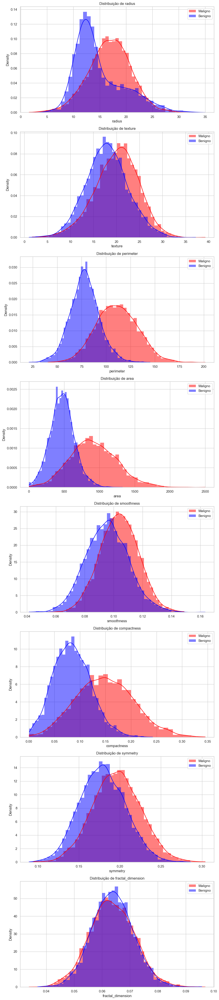

In [75]:
cancer_maligno = cancer[cancer.diagnosis_result ==  'M']
cancer_benigno = cancer[cancer.diagnosis_result ==  'B']

sns.set(style='whitegrid')

parametros_selecinados = ['radius', 'texture', 'perimeter', 'area', 'smoothness', 'compactness','symmetry', 'fractal_dimension'
       ]

fig, axes = plt.subplots(len(parametros_selecinados), 1, figsize = (10,45))

for i, parametros in enumerate(parametros_selecinados):
    sns.histplot(cancer_maligno[parametros], color = 'red', label = 'Maligno', ax = axes[i], kde = True, stat = 'density', linewidth = 0)
    sns.histplot(cancer_benigno[parametros], color = 'blue', label = 'Benigno', ax = axes[i], kde = True, stat = 'density', linewidth = 0)
    axes[i].set_title(f'Distribuição de {parametros}')
    axes[i].legend()

plt.tight_layout()
plt.show()

O histograma acima compara a distribuição das variáveis morfológicas de células tumorais benignas e malignas.<br>
As áreas vermelhas representam a distribuição das medidas morfológicas de células malignas, enquanto que as áreas azuis representam a distribuição das medidas morfológicas de células benignas.<br>
As características morfologicas como o raio tendem a apresentar medidas mais elevadas em células malignas, quando comparadas com células tumorais benignas. No entando há grande sobreposição entre as categorias quando observada sua distribuição. Os parâmetros que apresentam este comportamento podem ser úteis para diferenciar os dois tipos de diagnósticos. <br>
Já asa características morfológicas dadas por suavidade, simetria, dimenção fractal e textura apresentam grande sobreposição das curvas maligna e benigna, indicando que os valores entre os dois tipos de tumor são muito semelhantes, dificultando a diferenciação entre os tipos de tumor com base nestes parâmetro. <br>
Por fim, variáveis como perímetro, área e compacidade apresentam uma clara separação mais evidente entre as distribuições. Como observado no histograma, as curvas são mais afastadas, sugerindo que essas caracteristicas são melhores discriminadas entre maligno e benigno. 

Como evidenciado pelos resultados acima, a abordade de clusterização pode não ser a melhor abordagem.<br>
Desta forma, a ideia é tentar outras abordagens.

# 7. Abordagem de modelos supervisionados.

## 7.1. Arvores de decisão

In [76]:
cancer = cancer_dataframe.copy()

In [77]:
#  1. Codificando as variáveis categóricas
codificacao = OneHotEncoder(sparse_output=False)
variaveis_categoricas = ['tissue', 'diagnosis_result']

# Salvando a variável 'diagnosis_result' antes da codificação
y = cancer['diagnosis_result']

# Aplicando o One-Hot Encoding
variaveis_codificadas = codificacao.fit_transform(cancer[variaveis_categoricas])

# Convertendo para DF  e unido aos dados originais
df_codificado = pd.DataFrame(variaveis_codificadas, columns = codificacao.get_feature_names_out(variaveis_categoricas))
cancer = pd.concat([cancer.drop(columns=variaveis_categoricas), df_codificado], axis=1)

In [78]:
# 2. removendo as colunas codificadas
remover_colunas = [col for col in cancer.columns if 'diagnosis_result' in col]

# 3. Dividindo os dados entre treino e teste
X = cancer.drop(columns=remover_colunas)
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = parametro_random_state)

In [79]:
# 4. Treinando a arvore de decisão
arvore = DecisionTreeClassifier(random_state=parametro_random_state)
arvore.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [80]:
# Avaliando o modelo usando o conjunto de teste
y_pred = arvore.predict(X_test)


# Avaliando a acurácia do modelo
acuracia = accuracy_score(y_test, y_pred)
print(f'Acurácia:{acuracia: .2f}')


# Matriz de confusão e relatório de classificação
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


Acurácia: 0.90
[[1477  167]
 [ 158 1389]]
              precision    recall  f1-score   support

           B       0.90      0.90      0.90      1644
           M       0.89      0.90      0.90      1547

    accuracy                           0.90      3191
   macro avg       0.90      0.90      0.90      3191
weighted avg       0.90      0.90      0.90      3191



Os resultados evidenciados acima indicam:<br>
1. Acurácia = 0.9 -> 90% das previsões feitas pelo modelo estão corretas, o que indica um bom desempenho geral. <br><br>
2. Sobre a matriz de confusão:<br>
1477 amostras Benignas foram corretamente classificadas.<br>
167 amostras benignas foram classificadas incorretamente.<br>
158 amostras malignas foram classificadas incorretamente.<br>
1389 amostras malignas foram corretamente classificadas.<br><br>
3. Relatório de Classificação <br><br>
    Classe benigno:<br>
        precisão 0.9 -> 90% das amostras que o modelo previu como benignas foram classificadas corretamente.<br>
        Recall 0.9 -> 90% das amostras que realmente eram benignas foram corretamente identificadas pelo modelo, indicando que o modelo é eficaz em detectar amostras benignas. <br>
        F1-score 0.9 -> combinação de precisão e recall. o resultado obtido sugere que o modelo está balanceado em termos de precisão e capacidade de detecção da classe Benigno.<br><br>
    Classe maligno: <br>
        Precisão 0.89 -> O modelo foi capaz de prever corretamente 89% das amostras.<br>
        Recall 0.9 -> 90% das amostras foram identificadas corretametne pelo modelo.<br>
        F1-score 0.9 -> O resultado obtido sugere que o modelo está balanceado em termos de precisão e capacidade de detecção da classe Maligna.<br><br>
    Médias:<br>
        Macro avg 0.9 -> A média simples das metricas precisão, recall e F1-score para as duas classes. Como o conjunto de dados está balanceado, os valores são iguais.<br>
        Weighted avg 0.9 -> A média ponderada de precisão, recall e F1-score, levando em consideração o número de amostras em cadas classe. Neste caso, as classes estão relativamente balanceadas, então a média ponderada reflete bem o desempenho geral do modelo.

In [81]:
# 5. Otimização da árvore de decisão (Ajuste de hiperparâmetros)

# Grade de hiperparâmetros
grade_hiperparametros = {
    'criterion':['gini','entropy','log_loss'],
    'max_depth':[4,6,8,10],
    'min_samples_split':[2,10,20],
    'min_samples_leaf':[5,10,15],
    'max_features':['auto','sqrt','log2']
}

# Configurando o gridsearch
hiperparametros = GridSearchCV(DecisionTreeClassifier(random_state = parametro_random_state), grade_hiperparametros, cv = 5)

# Treinando o modelo
hiperparametros.fit(X_train, y_train)

# Melhores combinações de hiperparâmetros
print("Melhores hiperparâmetros:",  hiperparametros.best_params_)

# Reavaliando o modelo
y_pred = arvore.predict(X_test)

# Avaliando a acurácia do modelo
acuracia_ajustada = accuracy_score(y_test, y_pred)
print(f'Acurácia com ajuste:{acuracia_ajustada: .2f}')

c:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning:


540 fits failed out of a total of 1620.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
540 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\Lib\site-packages\sklea

Melhores hiperparâmetros: {'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 2}
Acurácia com ajuste: 0.90


In [82]:
# Setando os hiperparâmetretros conforme avaliado
arvore = DecisionTreeClassifier(
    max_depth=10,
    min_samples_leaf=5,
    min_samples_split=2,
    criterion='entropy',
    max_features='sqrt',
    random_state=parametro_random_state
)

arvore.fit(X_train, y_train)



DecisionTreeClassifier(criterion='entropy', max_depth=10, max_features='sqrt',
                       min_samples_leaf=5, random_state=42)

In [83]:
# Reavaliando o modelo

y_pred = arvore.predict(X_test)
print(f'Acurácia ajustada:{accuracy_score(y_test, y_pred):.2f}')

Acurácia ajustada:0.91


### Visualizando a Arvore

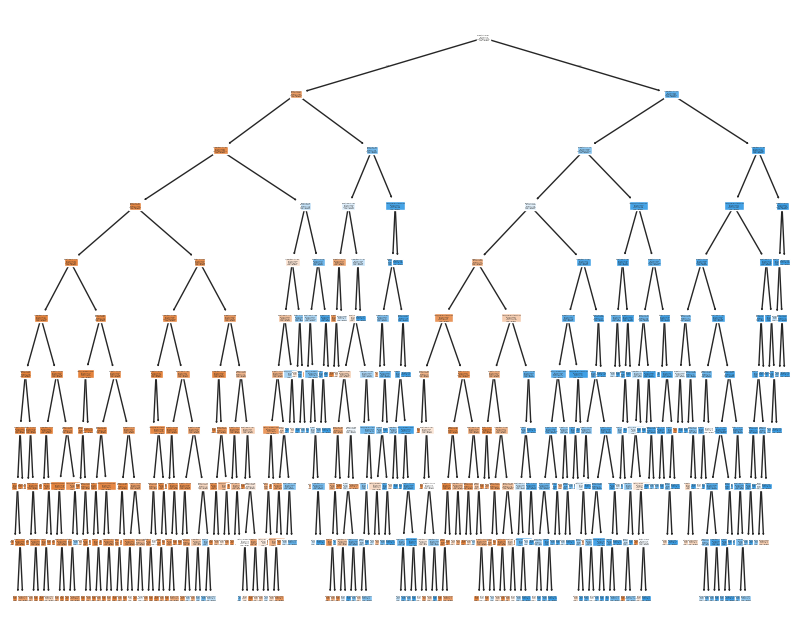

In [84]:
plt.figure(figsize=(10,8))
plot_tree(arvore, filled=True, feature_names=X.columns, class_names=['Benigno', 'Maligno'])
plt.show()

In [ ]:
# No graphviz
arvore_regras = export_text(arvore, feature_names=list(X.columns))
print(arvore_regras)

|--- perimeter <= 92.87
|   |--- area <= 756.03
|   |   |--- compactness <= 0.16
|   |   |   |--- area <= 531.49
|   |   |   |   |--- smoothness <= 0.10
|   |   |   |   |   |--- compactness <= 0.09
|   |   |   |   |   |   |--- radius <= 15.32
|   |   |   |   |   |   |   |--- symmetry <= 0.16
|   |   |   |   |   |   |   |   |--- texture <= 18.10
|   |   |   |   |   |   |   |   |   |--- class: B
|   |   |   |   |   |   |   |   |--- texture >  18.10
|   |   |   |   |   |   |   |   |   |--- symmetry <= 0.16
|   |   |   |   |   |   |   |   |   |   |--- class: B
|   |   |   |   |   |   |   |   |   |--- symmetry >  0.16
|   |   |   |   |   |   |   |   |   |   |--- class: B
|   |   |   |   |   |   |   |--- symmetry >  0.16
|   |   |   |   |   |   |   |   |--- class: B
|   |   |   |   |   |   |--- radius >  15.32
|   |   |   |   |   |   |   |--- texture <= 17.01
|   |   |   |   |   |   |   |   |--- class: B
|   |   |   |   |   |   |   |--- texture >  17.01
|   |   |   |   |   |   |   |   |--- s

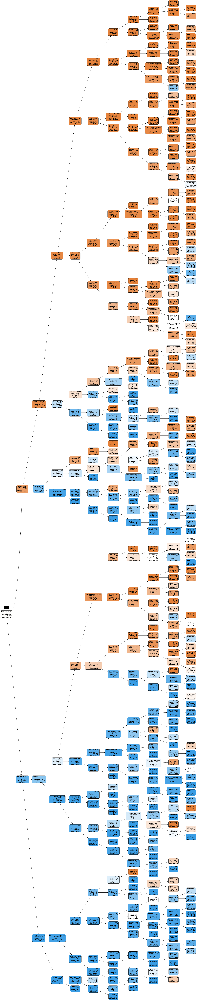

In [86]:
dot_data = export_graphviz(
    arvore, 
    out_file=None, 
    feature_names=X.columns,  
    class_names=['Benigno', 'Maligno'],  
    filled=True, 
    rounded=True,  
    special_characters=True,
    rotate = True
)

# Criar a visualização com pydotplus
graph = pydotplus.graph_from_dot_data(dot_data)  

# Salvar a imagem como PNG para exibir
graph.write_png("tree_visualization.png")

# Exibir a árvore
Image(graph.create_png())

# 8. Random Forest

## 8.1. Treinando o modelo Random Forest

In [87]:
random_forest = RandomForestClassifier(n_estimators = 100, random_state = parametro_random_state)
random_forest.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

## 8.2. Avaliando o modelo

In [88]:
 # Predição e avaliação do modelo
y_pred_forest = random_forest.predict(X_test)
 
 # Acurácia da Random Forest
acuracia_random_forest = round(accuracy_score(y_test,y_pred_forest),2)
print(f'Acurácia da Random Forest: {acuracia_random_forest}')


# Matriz de confusão e relatório de classificação
print(confusion_matrix(y_test,y_pred_forest))
print(classification_report(y_test,y_pred_forest))

Acurácia da Random Forest: 0.93
[[1540  104]
 [ 110 1437]]


              precision    recall  f1-score   support

           B       0.93      0.94      0.94      1644
           M       0.93      0.93      0.93      1547

    accuracy                           0.93      3191
   macro avg       0.93      0.93      0.93      3191
weighted avg       0.93      0.93      0.93      3191



Os resultados evidenciados acima indicam:<br>
1. Acurácia = 0.93 -> 93% das previsões feitas pelo modelo estão corretas, o que indica um bom desempenho geral. Significativamente melhor quando comparado ao modelo de árvore de decisão previamente calculado.<br><br>
2. Sobre a matriz de confusão:<br>
1540 amostras Benignas foram corretamente classificadas.<br>
104 amostras benignas foram classificadas incorretamente.<br>
110 amostras malignas foram classificadas incorretamente.<br>
1437 amostras malignas foram corretamente classificadas.<br><br>

Tais resultados sugerem uma melhora nos métodos classificatórios quando comparados à metodologia anterior. <br>
3. Relatório de Classificação <br><br>
    Classe benigno:<br>
        precisão 0.93 -> 93% das amostras que o modelo previu como benignas foram classificadas corretamente.<br>
        Recall 0.94 -> 94% das amostras que realmente eram benignas foram corretamente identificadas pelo modelo, indicando que o modelo é eficaz em detectar amostras benignas. <br>
        F1-score 0.94 -> combinação de precisão e recall. o resultado obtido sugere que o modelo está balanceado em termos de precisão e capacidade de detecção da classe Benigno.<br><br>
    Classe maligno: <br>
        Precisão 0.93 -> O modelo foi capaz de prever corretamente 93% das amostras.<br>
        Recall 0.93 -> 93% das amostras foram identificadas corretametne pelo modelo.<br>
        F1-score 0.93 -> O resultado obtido sugere que o modelo está balanceado em termos de precisão e capacidade de detecção da classe Maligna.<br><br>
    Médias:<br>
        Macro avg 0.93 -> A média simples das metricas precisão, recall e F1-score para as duas classes. Como o conjunto de dados está balanceado, os valores são iguais.<br>
        Weighted avg 0.93 -> A média ponderada de precisão, recall e F1-score, levando em consideração o número de amostras em cadas classe. Neste caso, as classes estão relativamente balanceadas, então a média ponderada reflete bem o desempenho geral do modelo.

## 8.3. Importância das Variáveis

In [89]:
# Avaliando a importancia de cada variável no modelo.

importancia = random_forest.feature_importances_
importancia_df = pd.DataFrame({'Feature': X.columns, 'Importance': importancia})
importancia_df = importancia_df.sort_values(by='Importance',ascending=True)
print(importancia_df)

                   Feature  Importance
9  tissue_Prostatic tissue    0.013428
8    tissue_Mammary tissue    0.015977
7        fractal_dimension    0.023470
1                  texture    0.037376
4               smoothness    0.040397
6                 symmetry    0.042211
0                   radius    0.054000
5              compactness    0.161873
3                     area    0.305327
2                perimeter    0.305939


## 8.4. Visualizando a imporancia das variáveis

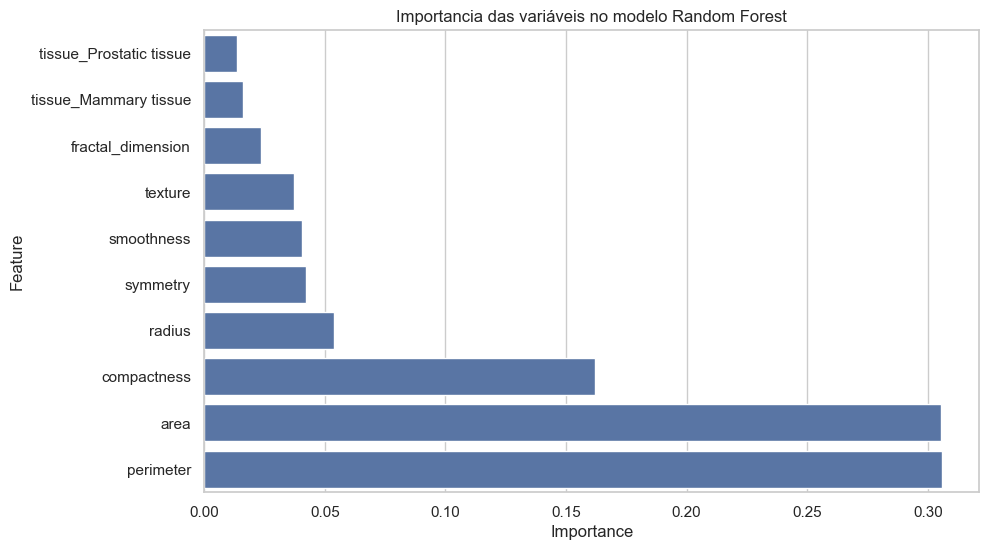

In [90]:
plt.figure(figsize = (10,6))
sns.barplot(
    x='Importance',
    y = 'Feature',
    data = importancia_df
    )

plt.title('Importancia das variáveis no modelo Random Forest')
plt.show()

# 9. Validação Cruzada

Verificar, através de validação cruzada (k-fold), a robustez do modelo em diferendes subconjuntos de dados, de modo a garantir que ele generalize bem para amostras não vistas.

In [91]:
scores = cross_val_score(random_forest, X, y, cv=5, scoring = 'accuracy')
print(f'Acurácia média na validação cruzada: {scores.mean():.2f}')

Acurácia média na validação cruzada: 0.93


# 10. Testando o modelo com conjunto de dados externos

In [92]:
X_amostra = amostra_cancer.drop(columns=['diagnosis_result'])
X_amostra=pd.get_dummies(X_amostra, drop_first=True)
X_amostra = X_amostra.reindex(columns=X_train.columns, fill_value=0)
y_amostra = amostra_cancer['diagnosis_result']
y_pred_amostra = random_forest.predict(X_amostra)

In [93]:
acuracia_amostra = accuracy_score(y_amostra, y_pred_amostra)
print(f'Acuracia na amostra externa:{acuracia_amostra:.2f}')

Acuracia na amostra externa:0.93


# 11. Explicação das Previsões

In [94]:
# Criando o explicador LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                   feature_names=X.columns, 
                                                   class_names=['Benigno', 'Maligno'], 
                                                   mode='classification')

# Escolhendo uma amostra do conjunto de teste
i = 25
exp = explainer.explain_instance(X_test.values[i], random_forest.predict_proba)

# Mostrando a explicação
exp.show_in_notebook(show_table=True)

c:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



c:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

c:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

c:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

c:\Users\Eduardo Socca\OneDrive\Cursos online\MBA Data Science e Analytics - USP Esalq\TCC\Projeto TCC\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fit

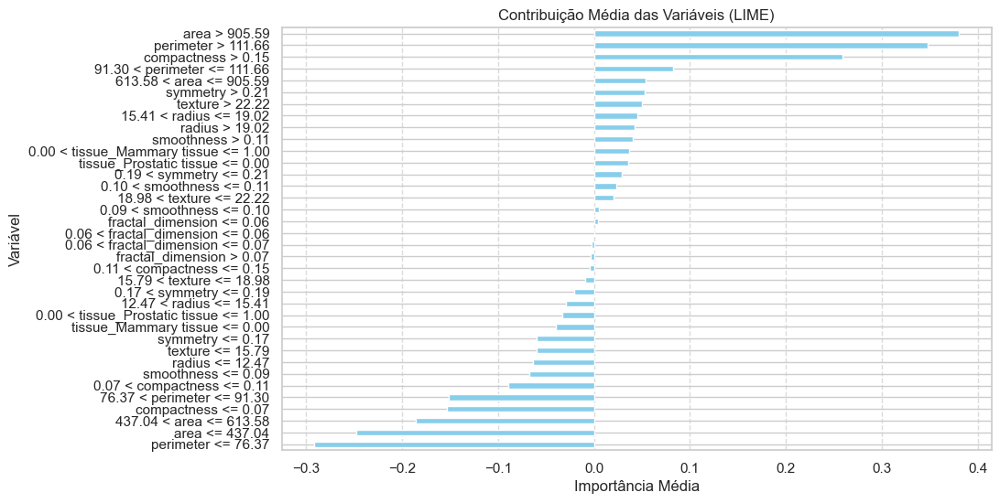

In [95]:
# Gerando uma lista de índices aleatórios sem repetição
num_amostras = 30  # Número de amostras a serem explicadas
indices = np.random.choice(len(X_test), size=num_amostras, replace=False)

# Coletando as contribuições das variáveis para cada explicação
contribuicoes = []

for i in indices:
    exp = explainer.explain_instance(X_test.values[i], random_forest.predict_proba)
    explicacoes = dict(exp.as_list())
    contribuicoes.append(explicacoes)

# Criando um DataFrame para armazenar as contribuições das variáveis
df_contribuicoes = pd.DataFrame(contribuicoes)

# Calculando a média das contribuições por variável
media_contribuicoes = df_contribuicoes.mean()

# Plotando o gráfico das contribuições médias
plt.figure(figsize=(10, 6))
media_contribuicoes.sort_values().plot(kind='barh', color='skyblue')
plt.title('Contribuição Média das Variáveis (LIME)')
plt.xlabel('Importância Média')
plt.ylabel('Variável')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

O método LIME (Local Interpretable Model-agnostic Explanations) é uma técnica usada para interpretar modelos de aprendizado de máquina, como modelos de redes neurais e árvores de decisão complexas.<br>
O modelo indica uma alta probabilidade de classificação como diagnóstico maligno (98%) e uma baixa probabilidade de classificar o diagnóstico como benigno (2%)<br>
Avaliando as características mais relevantes, é possivel verificar que para o diagnóstico maligno variáveis como perímetro, compacidaede, suavidade, raio e área também contribuem para o diagnóstico

# 12. Ajuste de hiperparâmetros

In [96]:
# # Classe de exceção personalizada
# class tempolimite(Exception):
#     pass

# # Função para executar o grid search em um processo separado
# def executar_grid_search(grid_search, X_train, y_train):
#     grid_search.fit(X_train, y_train)
#     return grid_search.best_params_

# # Função para limitar o tempo de execução
# def tempo_execucao(tempo_limite, grid_search, X_train, y_train):
#     # Criar um processo separado para o GridSearchCV
#     pool = multiprocessing.Pool(processes=1)
#     result = pool.apply_async(executar_grid_search, (grid_search, X_train, y_train))

#     try:
#         # Aguardar o resultado até o tempo limite
#         best_params = result.get(timeout=tempo_limite)
#         print("Melhores hiperparâmetros:", best_params)
#     except multiprocessing.TimeoutError:
#         # Se o tempo limite for atingido, o pool será fechado
#         pool.terminate()
#         print("Execução interrompida. Limite de tempo de execução atingido.")
#     finally:
#         pool.close()
#         pool.join()

# # Grade de hiperparâmetros
# grade_hiperparametros = {
#     'criterion': ['gini', 'entropy', 'log_loss'],
#     # 'n_estimators': [100],  
#     'max_depth': [4, 6, 8, 10],
#     'min_samples_split': [2, 10, 20],
#     'min_samples_leaf': [5, 10, 15],
#     'max_features': ['auto', 'sqrt', 'log2']
# }

# # Configurando o GridSearchCV
# hiperparametros = GridSearchCV(random_forest, grade_hiperparametros, cv=3, scoring='accuracy')

# # Defina o tempo limite em segundos
# tempo_limite = 300

# # Limitar a execução a um tempo máximo
# tempo_execucao(tempo_limite, hiperparametros, X_train, y_train)

In [96]:
from sklearn.model_selection import RandomizedSearchCV

# Classe de exceção personalizada
class tempolimite(Exception):
    pass

# Função para executar o randomized search em um processo separado
def executar_random_search(random_search, X_train, y_train):
    random_search.fit(X_train, y_train)
    return random_search.best_params_

# Função para limitar o tempo de execução
def tempo_execucao(tempo_limite, random_search, X_train, y_train):
    # Criar um processo separado para o RandomizedSearchCV
    pool = multiprocessing.Pool(processes=1)
    result = pool.apply_async(executar_random_search, (random_search, X_train, y_train))

    try:
        # Aguardar o resultado até o tempo limite
        best_params = result.get(timeout=tempo_limite)
        print("Melhores hiperparâmetros:", best_params)
    except multiprocessing.TimeoutError:
        # Se o tempo limite for atingido, o pool será fechado
        pool.terminate()
        print("Execução interrompida. Limite de tempo de execução atingido.")
    finally:
        pool.close()
        pool.join()

# Grade de hiperparâmetros
grade_hiperparametros = {
    'criterion': ['gini', 'entropy'],
    # 'n_estimators': [100,200,300]
    'max_depth': [4, 6, 8, 10],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [5, 10, 15],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Configurando o RandomizedSearchCV 
hiperparametros = RandomizedSearchCV(
    random_forest,
    grade_hiperparametros,
    n_iter=300,
    cv=5,
    scoring='accuracy',
    n_jobs=-1
)

# Defina o tempo limite em segundos
limit_time = 10800

# Limitar a execução a um tempo máximo
print(tempo_execucao(limit_time, hiperparametros, X_train, y_train))

melhores_parametros = tempo_execucao(limit_time, hiperparametros, X_train, y_train)


Execução interrompida. Limite de tempo de execução atingido.
None


# 13. APlicando os melhores hiperparâmetros

In [97]:
# # Aplicando os melhores hiperparâmetros encontrados
# melhore_parametros = hiperparametros.best_params_
# random_forest_otimizada = RandomForestClassifier(**melhore_parametros, random_state = parametro_random_state)
# random_forest_otimizada.fit(X_train, y_train)

In [105]:
# Setando os hiperparâmetretros conforme avaliado
arvore_otimizada = DecisionTreeClassifier(
    max_depth=10,
    min_samples_leaf=5,
    min_samples_split=2,
    criterion='entropy',
    max_features='sqrt',
    random_state=parametro_random_state
)

arvore_otimizada.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, max_features='sqrt',
                       min_samples_leaf=5, random_state=42)

In [106]:
# Avaliando o modelo otimizado
y_pred_otimizado = arvore_otimizada.predict(X_test)
acuracia_otimizada = accuracy_score(y_test, y_pred_otimizado)
print(f'Acurácia do modelo otimizado: {acuracia_otimizada:.2f}')

Acurácia do modelo otimizado: 0.91


In [104]:
scores = cross_val_score(arvore_otimizada, X, y, cv=5, scoring = 'accuracy')
print(f'Acurácia média na validação cruzada na árvore otimizada: {scores.mean():.2f}')

Acurácia média na validação cruzada: 0.91


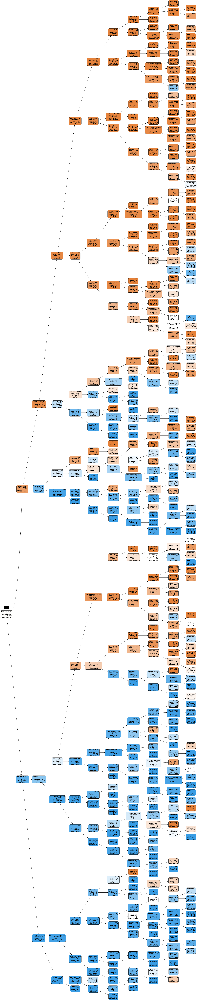

In [100]:
dot_data = export_graphviz(
    arvore_otimizada, 
    out_file=None, 
    feature_names=X.columns,  
    class_names=['Benigno', 'Maligno'],  
    filled=True, 
    rounded=True,  
    special_characters=True,
    rotate = True
)

# Criar a visualização com pydotplus
graph = pydotplus.graph_from_dot_data(dot_data)  

# Salvar a imagem como PNG para exibir
graph.write_png("arvore otimizada.png")

# Exibir a árvore
Image(graph.create_png())

In [110]:
scores_otimizados = cross_val_score(arvore_otimizada, X_train, y_train, cv=5, scoring='accuracy')
print(f'Acurácia média na validação cruzada (modelo otimizado): {scores_otimizados.mean():.2f}')

Acurácia média na validação cruzada (modelo otimizado): 0.91


In [111]:
variaveis_importantes_otimizadas = arvore_otimizada.feature_importances_
variaveis_importantes_otimizadas_df = pd.DataFrame({'Feature': X.columns, 'Importance': variaveis_importantes_otimizadas})
variaveis_importantes_otimizadas_df = variaveis_importantes_otimizadas_df.sort_values(by='Importance', ascending=False)
print(variaveis_importantes_otimizadas_df)

                   Feature  Importance
2                perimeter    0.479714
3                     area    0.257947
5              compactness    0.140038
4               smoothness    0.026747
6                 symmetry    0.025116
0                   radius    0.021295
8    tissue_Mammary tissue    0.019992
1                  texture    0.014513
9  tissue_Prostatic tissue    0.008159
7        fractal_dimension    0.006480


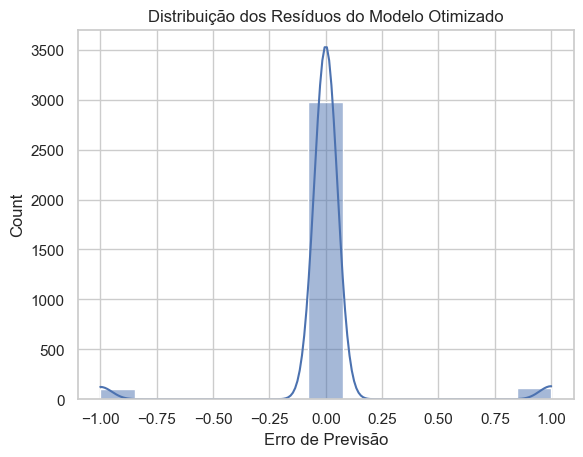

In [113]:
# Converter B e M para 0 e 1 em y_pred_forest
y_pred_forest1 = np.where(y_pred_forest == 'B', 0, 1)

# Converter B e M para 0 e 1 em y_test
y_test_otimized = np.where(y_test == 'B', 0, 1)

# Garantir que ambos são arrays numéricos e sem valores faltantes
y_pred_forest1 = pd.to_numeric(y_pred_forest1, errors='coerce')
y_test_otimized = pd.to_numeric(y_test_otimized, errors='coerce')

# Remover quaisquer valores NaN
valid_indices = ~np.isnan(y_pred_forest1) & ~np.isnan(y_test_otimized)
y_pred_forest1 = y_pred_forest1[valid_indices]
y_test_otimized = y_test_otimized[valid_indices]

# Calcular resíduos
residuos = y_test_otimized - y_pred_forest1

# Plotar distribuição dos resíduos
sns.histplot(residuos, kde=True)
plt.title('Distribuição dos Resíduos do Modelo Otimizado')
plt.xlabel('Erro de Previsão')
plt.show()

In [114]:
matriz_otimizada = confusion_matrix(y_test, y_pred_forest)
print(matriz_otimizada)
print(classification_report(y_test, y_pred_forest))

[[1540  104]
 [ 110 1437]]
              precision    recall  f1-score   support

           B       0.93      0.94      0.94      1644
           M       0.93      0.93      0.93      1547

    accuracy                           0.93      3191
   macro avg       0.93      0.93      0.93      3191
weighted avg       0.93      0.93      0.93      3191



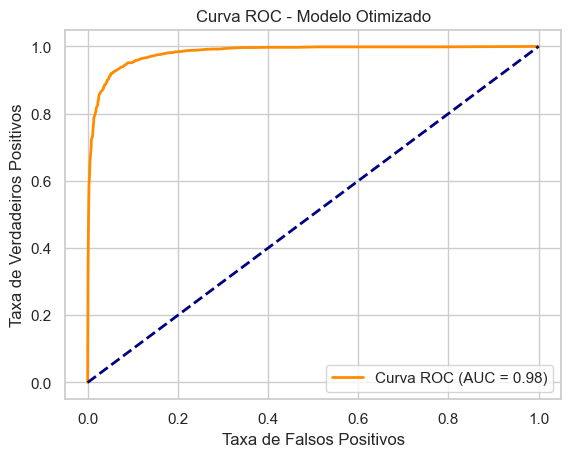

In [115]:
from sklearn.metrics import roc_curve, auc

# Converter B e M para 0 e 1 em y_test
y_test_otimizado = np.where(y_test == 'B', 0, 1)

# Obter as probabilidades previstas para a classe positiva (M = 1)
y_otimizado = random_forest.predict_proba(X_test)[:, 1]

# Calcular a curva ROC
fpr, tpr, _ = roc_curve(y_test_otimizado, y_otimizado)
roc_auc = auc(fpr, tpr)

# Plotar a curva ROC
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Curva ROC - Modelo Otimizado')
plt.legend(loc='lower right')
plt.show()

# Documentação

In [101]:
with open('documentacao.txt', 'w', encoding = 'utf-8') as doc:
    doc.write("1. Instalação das Bibliotecas. \n")
    doc.write("Nesta etapa se encontram todas as bibliotecas instaladas no ambiente virtual para execução do projeto. \n")